# Fashion MNIST PCA Tutorial
In this notebook we will explore the impact of implementing Principal Component Anlysis to an image dataset. For this, we will use the benchmark Fashion MNIST dataset, the link to this dataset can be found [here](https://github.com/zalandoresearch/fashion-mnist/tree/master/data/fashion). Indeed, the images from the dataset are 784-dimensional images. In this small tutorial we seek to explore if we can further compress the dimension of these images without loosing valuable information.

## Library import
We will first load all necessary libraries as well as some helper functions that will allow us to prepare the data.

In [2]:
import numpy as np
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
from helpers import *
import pandas as pd
import sklearn
from sklearn.decomposition import PCA

/home/federicoarenasl/miniconda3/envs/py3iaml/lib/python3.7/site-packages/sklearn/utils/__init__.py:4: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Sequence


## Fashion MNIST labels
As described [here](https://github.com/zalandoresearch/fashion-mnist), the dataset contains 60k training examples, and 10k testing examples. Each training example is accomanied with a respective label, which can either be:
- 0 	T-shirt/top
- 1 	Trouser
- 2 	Pullover
- 3 	Dress
- 4 	Coat
- 5 	Sandal
- 6 	Shirt
- 7 	Sneaker
- 8 	Bag
- 9 	Ankle boot

We will visualize these labels in due time but first, let's load the data using the load_FashionMNIST method provided by the [data providors](https://github.com/zalandoresearch/fashion-mnist).

In [3]:
# Load Data
DataPath = 'data'
Xtrn, Ytrn, Xtst, Ytst = load_FashionMNIST(DataPath)

Let's make a copy of the original data, since we'll make further transformations to ``` Xtn, Ytrn, Xtst,``` and ```Ytst```.

In [4]:

# Make backup
Xtrn_orig, Xtst_orig = Xtrn, Xtst

Let's prepare our data for the PCA by dividing all elements in the dataset by 255, so we have pixel intensities between 0 and 1 and let's center the data by substracting their means. This is called [normalizing](https://www.educative.io/edpresso/data-normalization-in-python) the data, and it is a key pre-processing step before any PCA can be applied on a dataset.

In [5]:
# Divide elements
Xtrn = np.divide(Xtrn, 255)
Xtst = np.divide(Xtst, 255)

In [6]:
# Calculate means
Xmean = Xtrn.mean(axis=0)

In [7]:
# Substract means
Xtrn_nm = Xtrn - Xmean
Xtst_nm = Xtst - Xmean

## Visualizing the mean representation of each class
Let's now focus our attention in visualizing the mean representation of each class. We can do this by getting the mean vector from each class and plotting it with the help of matplotlib's ```ax.imshow``` method. We can further our anlysis by looking at the 2 closest and 2 furthest samples from the mean. This can be done by comparing the [Euclidean Distance](https://www.geeksforgeeks.org/calculate-the-euclidean-distance-using-numpy/) of all samples to the mean, sorting them, and grabbing the two that have the smallest distance, and the two that have the furthest.

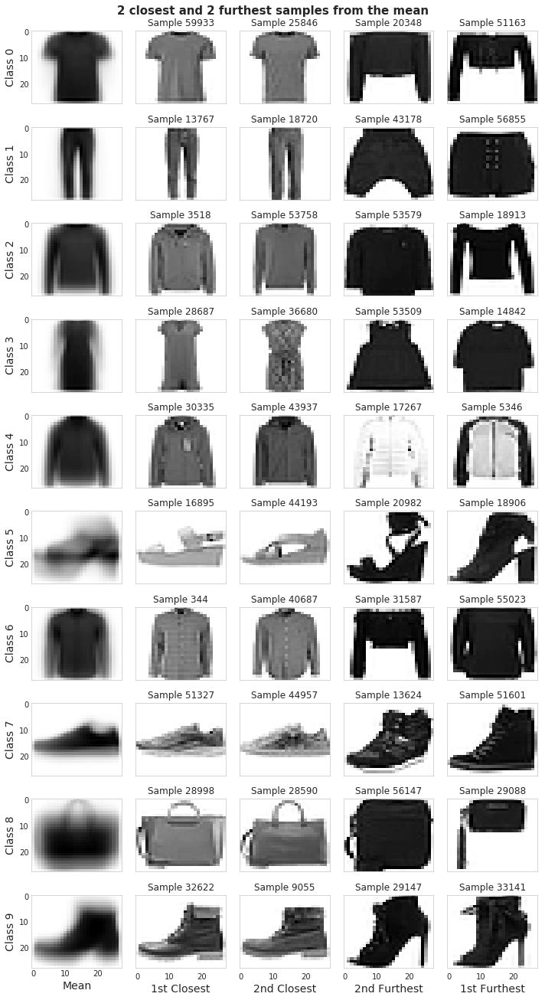

In [9]:
sns.set_style("whitegrid", {'axes.grid' : False})
# Create dataframe that joins the classes and features and sorts them by class
data_ds = pd.concat([pd.DataFrame(data=Xtrn), pd.DataFrame(data=Ytrn, columns=['class'])]
                , axis=1).sort_values(by=['class'])

# Get dfs of each class with instances sorted by Euclidean Distance to the mean of the class
class_dfs_ED, class_mean_dictionnaries = EuclideanCalculator(data_ds)


# Plot the grid of images
fig, axes = plt.subplots(10,5, figsize = (10,18), sharex=True, sharey = True, constrained_layout = True )

for i in range(len(axes)):
    axes[i,0].set_ylabel("Class "+ str(i), fontsize=14)
    
    axes[i,0].imshow(class_mean_dictionnaries[i].reshape(28,28), aspect='auto', cmap = "gray_r")
    axes[i,1].set_title("Sample "+str(class_dfs_ED[i].index[0]))
    axes[i,1].imshow(class_dfs_ED[i].iloc[0, 1:].values.reshape(28,28), aspect='auto', cmap = "gray_r")
    axes[i,2].set_title("Sample "+str(class_dfs_ED[i].index[1]))
    axes[i,2].imshow(class_dfs_ED[i].iloc[1, 1:].values.reshape(28,28), aspect='auto', cmap = "gray_r")
    axes[i,3].set_title("Sample "+str(class_dfs_ED[i].index[-2]))
    axes[i,3].imshow(class_dfs_ED[i].iloc[-2, 1:].values.reshape(28,28), aspect='auto', cmap = "gray_r")
    axes[i,4].set_title("Sample "+str(class_dfs_ED[i].index[-1]))
    axes[i,4].imshow(class_dfs_ED[i].iloc[-1, 1:].values.reshape(28,28), aspect='auto', cmap = "gray_r")
    axes[i,0].tick_params(axis=u'both', which=u'both',length=0)

axes[9,0].set_xlabel("Mean", fontsize=14)
axes[9,1].set_xlabel("1st Closest", fontsize=14)
axes[9,2].set_xlabel("2nd Closest", fontsize=14)
axes[9,3].set_xlabel("2nd Furthest", fontsize=14)
axes[9,4].set_xlabel("1st Furthest", fontsize=14)

fig.suptitle("2 closest and 2 furthest samples from the mean", y=1.005, fontweight = 'bold', fontsize=15)
plt.tight_layout()
plt.show()

From the plot we can see that the Mean represents the protypical representation of the class. The samples that have the smallest Euclidean distance are the ones whose shape varies the least from the shape of the Mean. The samples that have the largest Euclidean distance are the ones whose shape differs the most from the Mean. With our Principal Components (PCs) analysis we hope to find PCs that allow us to represent the most samples faithfully with much less dimensions.

The PCA will try to extract vector representations of the data that represent our data the best, this should include the samples that are the furthest from the Mean. Let's start this analyisis by performing some initial PCA on our data.

## Principal Component Analysis on the Fashion MNIST Data
Let's perform PCA on our data by using the ```PCA``` class from ```sklearn```, and let's look at the explained variances from the first 5 components, we should find some interesting insights, since variance is the key decision factor for our PCA. More on this [here](https://towardsdatascience.com/a-one-stop-shop-for-principal-component-analysis-5582fb7e0a9c).

In [11]:
# Initialize PCA object
pca = PCA()

# Fit PCA to normalized data with no components
fitted = pca.fit_transform(Xtrn_nm)

# Cumulative explained variance
cum_exp_variance = np.cumsum(pca.explained_variance_)

# Print first 5 PCs' cumulative explained variance
# Should we print the the explained variances or the cumulative explained variances?

# Return the pca object for further use
print(f"First 5 PCs: {pca.explained_variance_[:5]}")

First 5 PCs: [19.80980567 12.11221047  4.10615661  3.38182839  2.62477022]


From the results we can see that the first Principal Component accounts for a large part of the variance of the data. The variance for which a PC accounts decreases as we move further away from the 1st PC.

Let's look at this at a much larger scale, let's see what happens with this variance when we extend it to 784 PCs.

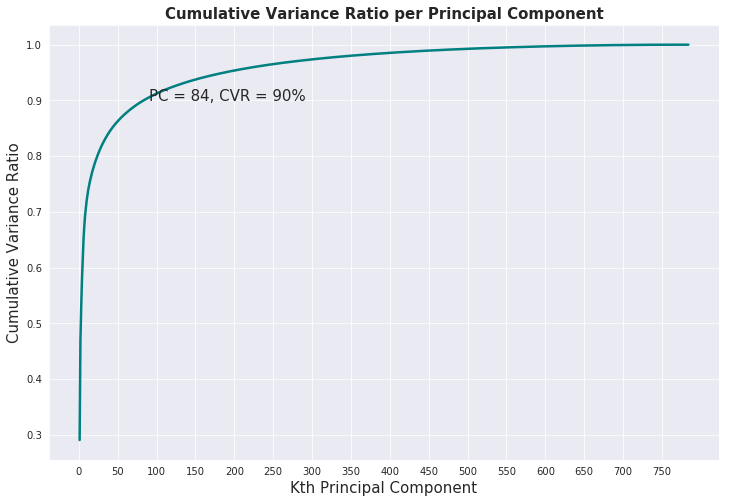

In [12]:
# Set plot specifications
sns.set_style('darkgrid')
fig = plt.figure(figsize=(12,8))
lw = 2.5

# Get pca object and explained variance ratio
pca = PCA()
# Fit PCA to normalized data with no components
fitted = pca.fit_transform(Xtrn_nm)

explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)
first_evec_90 = np.where(cumulative_variance_ratio >= 0.9)[0][0]

# Plot cumulative explained variance ratio
PCs = list(range(1, len(explained_variance_ratio)+1))
plt.plot(PCs, np.cumsum(explained_variance_ratio), color= 'teal', linewidth = lw)
plt.annotate("PC = "+str(first_evec_90+1)+", CVR = 90%", (90, 0.9)).set_fontsize(15)
plt.title('Cumulative Variance Ratio per Principal Component',fontsize=15, fontweight="bold")
plt.xticks(np.arange(0,len(PCs), 50))
plt.xlabel('Kth Principal Component', fontsize = 15)
plt.ylabel('Cumulative Variance Ratio', fontsize = 15)
plt.show()

From the figure we can see that the first 84 Principal Components are able to explain 90% of the variance in the Fashion-MNIST data. We could then take the
decision of reducing the dimensionality of the data to 84 dimensions, and most of the variance would be kept. Indeed, we can't perform PCA on a dataset and arbitrarily choose which dimensionality to compress it to. We have to performa thoughtful analysis so we keep the most information we can, while using the least dimensions.

We can perform a little excercise by reducing our data to two dimensions, and see if there is any dicernible information to extract from this reduction. Let's look at this with a simple scatterplot.

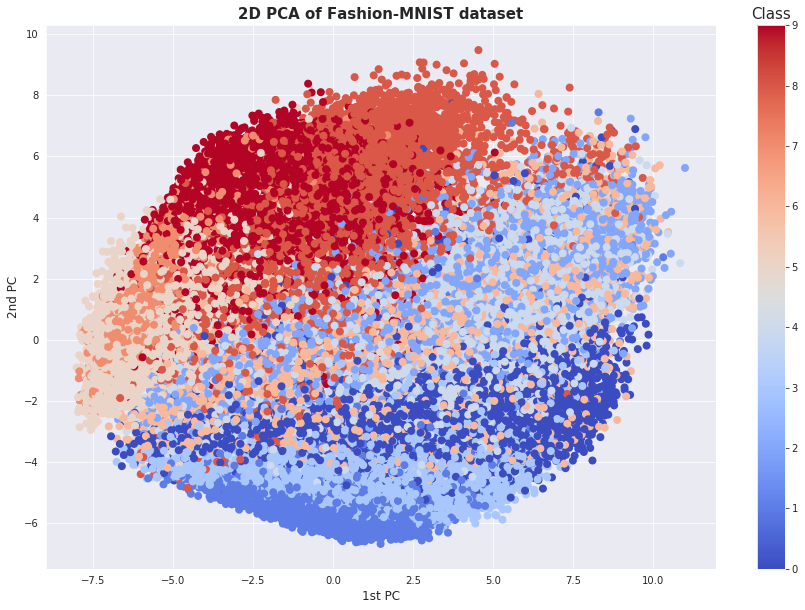

In [15]:
sns.set_style("darkgrid")

# Initialize PCA object
pca = PCA(n_components=2)

# Fit PCA to normalized data with no components
fitted_2D = pca.fit_transform(Xtrn_nm)

plt.figure(figsize=(15,10))
lw = 2

sc = plt.scatter(fitted_2D.T[0], fitted_2D.T[1], c=Ytrn, cmap=plt.cm.coolwarm, alpha=1, lw=lw)
clb = plt.colorbar(sc)
clb.ax.set_title('Class', fontsize=15)
plt.xlabel("1st PC", fontsize=12)
plt.ylabel("2nd PC", fontsize=12)
plt.title('2D PCA of Fashion-MNIST dataset', fontweight = 'bold', fontsize=15)

plt.show()

From the figure we can see that a compression from 784D to 2D compresses the data too much for there to be a clear separation between the classes. It is perhaps arguable that there are 3 high-density areas in the data, and that classes 7, 8 and 9 are clustered together at the top of the plot. However, the 2D representation of the data is too poor to actually tell if there are any clear clusters in the data. To better understand these high density areas, we could plot a 3-dimensional plot to determine if there are clusters that purely include only one class, but this wouldn't ensure any improvement from the 2D visualization.

## Visualizing our PCs as images
PCA is at times difficult to understand when we think of it in vector space, and all the big linear algebra terms can be daunting. Let's look at what these PCs mean for our image data, looking at them as images.

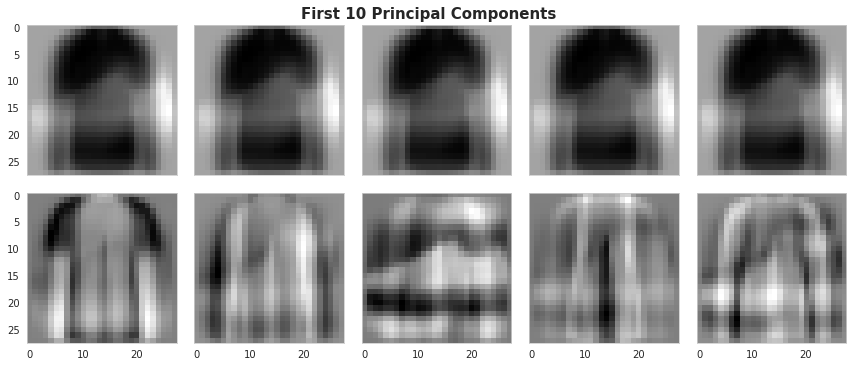

In [16]:
sns.set_style("whitegrid", {'axes.grid' : False})
# Get pca object and explained variance ratio
pca = PCA()
# Fit PCA to normalized data with no components
fitted = pca.fit_transform(Xtrn_nm)

# Plot the grid of images
fig, axes = plt.subplots(2,5, figsize = (12,5), sharex=True, sharey = True, constrained_layout = True )

# First 10 principal components
f_10_PCS = [pca.components_[i].reshape(28,28) for i in range(0,10)]

for pc in range(0,5):
    axes[0,pc].imshow(f_10_PCS[0], aspect='auto', cmap = "gray_r")
    axes[1,pc].imshow(f_10_PCS[pc+5], aspect='auto', cmap = "gray_r")

fig.suptitle("First 10 Principal Components", y=1.01, fontweight = 'bold', fontsize='15')
plt.tight_layout()
plt.show()

From the figure we can see that PCA is capable of creating adaptive filters that fit the trends in the data. In this case, the first 10 Principal Components show most of the shapes that we will see in the datasets, from long shirts to shoes. Furthermore, since the first PC is the one that explains the most variance in the data, it shows that the most variance in the data can be found between the pixel values of a dark shirt and the pixel values of a white shoe.

## Root Mean Squared Error as a proxy for PCA representational Error
Let's now look at the impact of using different $K$ number of PCs to represent our data by measuring it with [RMSE](https://www.askpython.com/python/examples/rmse-root-mean-square-error) for each of the 9 classes. Let's do this for $K = [5, 20, 50, 200]$. We can measure this by using the ```sklearn.metrics.mean_squared_error``` method.

In [18]:
# Classes and K components to loop over
classes = list(range(0,10))
k_components = [5, 20, 50, 200]

k_general_dict = {}
for k_component in k_components:
    # PCA instanciation
    pca_k = PCA(n_components = k_component, random_state=1000)
    
    # Perform PCA in all samples from single class
    reduced = pca_k.fit_transform(Xtrn)
    # Recover reduced samples
    recovered = pca_k.inverse_transform(reduced)
    
    # Get provisional components
    k_general_dict[k_component] = recovered
        
# Initialize dictionnary to store recovered first samples from each class
k_pca_dict = {}
# Initialize dictionnary to store RMSE for each first original/recovered sample from each class
k_RMSE_dict = {}

for class_ in classes:
    # Initialize dictionnaries to store Recovered Sample and RMSE 
    class_components = {}
    rmse_components = {}
    
    # Get original class
    original_class = Xtrn[np.where(Ytrn==class_)]
    
    for k_component in k_components:
        # Get recovered from K components
        k_recovered = k_general_dict[k_component]
        
        # Calculate RMSE
        recovered_class = k_recovered[np.where(Ytrn==class_)]

        # Store first recovered sample
        class_components[str(k_component)] = recovered_class[0]
        
        # Root Mean Square Error Calculation of first sample
        rmse = np.sqrt(sklearn.metrics.mean_squared_error(original_class[0], recovered_class[0]))
        
        key = "K="+str(k_component)
        rmse_components[key] = rmse
        
    
    # Store PCA and RMSE values for all K components for a single class
    k_RMSE_dict[class_] = rmse_components
    k_pca_dict[class_] = class_components

pd.DataFrame.from_dict(k_RMSE_dict, orient='index')

,K=5,K=20,K=50,K=200
0,0.001005,0.000589,0.000500,0.000241
1,0.000777,0.000551,0.000375,0.000136
2,0.000779,0.000570,0.000485,0.000322
3,0.000571,0.000421,0.000326,0.000223
4,0.000464,0.000403,0.000344,0.000184
5,0.000710,0.000624,0.000558,0.000353
6,0.000508,0.000375,0.000283,0.000180
7,0.000650,0.000502,0.000419,0.000250
8,0.000876,0.000569,0.000484,0.000362
9,0.000720,0.000595,0.000479,0.000279


We can see that, as expected, the more components we use to represent our data, the more the RMSE approaches 0. However, classes such as $0, 2, 5, 7, 8$ and $9$ are more difficult to represent using a low number of components, since their RMSEs are significantly higher than the rest at each K.

## Fashion MNIST images compressed at different rates
Finally, let's compress our own data and visualize some of these samples to see what the PCA does on our data.

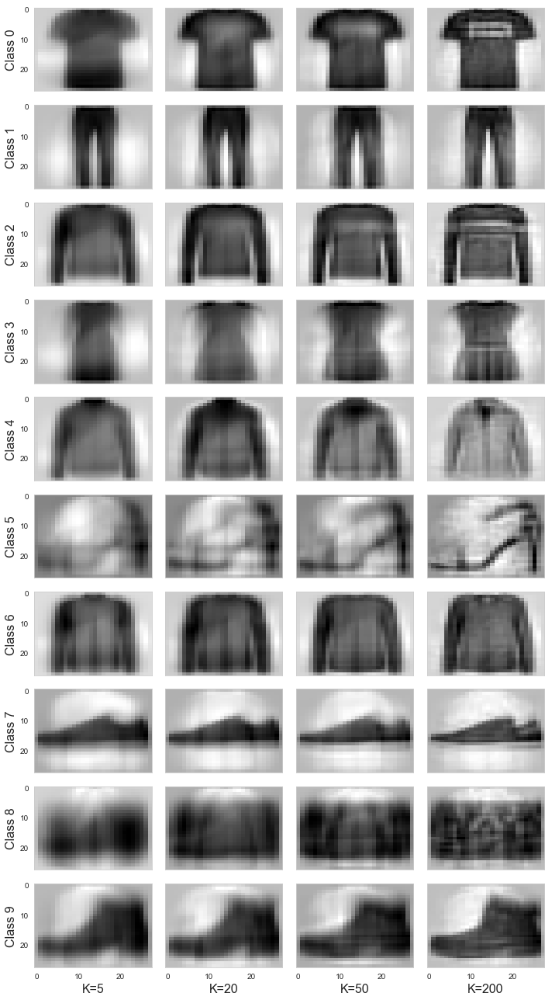

In [13]:
# Q1.7
def iaml01cw2_q1_7():
    sns.set_style("whitegrid", {'axes.grid' : False})

    # Plot the grid of images
    fig, axes = plt.subplots(10,4, figsize = (10,18), sharex=True, sharey = True, constrained_layout = True )

    classes = list(range(0,10))
    k_components = ['5', '20', '50', '200']

    # Class means
    data_ds = pd.concat([pd.DataFrame(data=Xtrn_nm), pd.DataFrame(data=Ytrn, columns=['class'])]
                        , axis=1).sort_values(by=['class'])

    class_mean_dict = NormMeanCalculator(data_ds)

    # Dictionnary of reconstructed samples per class per K components
    k_pca_dict = iaml01cw2_q1_6()[0]

    for i in range(len(classes)):
        # Add mean to reconstructed samples
        k5_rec_s = k_pca_dict[i]['5'] + class_mean_dict[i]
        k20_rec_s = k_pca_dict[i]['20'] + class_mean_dict[i]
        k50_rec_s = k_pca_dict[i]['50'] + class_mean_dict[i]
        k200_rec_s = k_pca_dict[i]['200'] + class_mean_dict[i]

        axes[i,0].set_ylabel("Class "+ str(i), fontsize=16)
        axes[i,0].imshow(k5_rec_s.reshape(28,28), aspect='auto', cmap = "gray_r")
        axes[i,1].imshow(k20_rec_s.reshape(28,28), aspect='auto', cmap = "gray_r")
        axes[i,2].imshow(k50_rec_s.reshape(28,28), aspect='auto', cmap = "gray_r")
        axes[i,3].imshow(k200_rec_s.reshape(28,28), aspect='auto', cmap = "gray_r")

    axes[9,0].set_xlabel("K=5", fontsize=16)
    axes[9,1].set_xlabel("K=20", fontsize=16)
    axes[9,2].set_xlabel("K=50", fontsize=16)
    axes[9,3].set_xlabel("K=200", fontsize=16)

    #fig.suptitle("First Sample reconstruction with K components", y=1.01, fontweight = 'bold', fontsize='15')
    plt.tight_layout()
    plt.show()

iaml01cw2_q1_7()   # comment this out when you run the function

From the figure we can see that as the number of K components are increased, the level of detail of the representation increases. Also, we can see that for each column of images, the ones that appear the noisiest are the ones that have the highest RMSEs. This is because the PCA algorithm has more difficulty to represent the classes’ variance in less dimensions.

## A final note
From this small demostration we can see that PCA is a powerful tool to compress our data. Indeed, we could use this PCA on the Fashion MNIST data to speed up the training of a clothing recognition system. However, a key takeaway is that we must be sensitive about _how much_ we compress our data. We have to make a thorough analysis before choosing the dimension we will reduce our images to.